In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv("C:/Users/savil/Downloads/bank-additional/bank-additional/bank-additional-full.csv", sep=';')

### This project is almost parallel to Loan Prediction dirty 
### but this time I will be cleaning the data more and getting rid of certain attributes

In [3]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,...,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [4]:
df.isnull().sum()

age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

In [5]:
df.shape

(41188, 21)

In [6]:
df.dtypes

age                 int64
job                object
marital            object
education          object
default            object
housing            object
loan               object
contact            object
month              object
day_of_week        object
duration            int64
campaign            int64
pdays               int64
previous            int64
poutcome           object
emp.var.rate      float64
cons.price.idx    float64
cons.conf.idx     float64
euribor3m         float64
nr.employed       float64
y                  object
dtype: object

In [7]:
import pandas_profiling as pp

In [8]:
dir(pp)

['Config',
 'ProfileReport',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__init__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 '__version__',
 'clear_config',
 'config',
 'controller',
 'model',
 'pandas_decorator',
 'profile_report',
 'report',
 'serialize_report',
 'utils',
 'version',
 'visualisation']

In [10]:
pp.ProfileReport(df)

In [11]:
corr = df.corr()

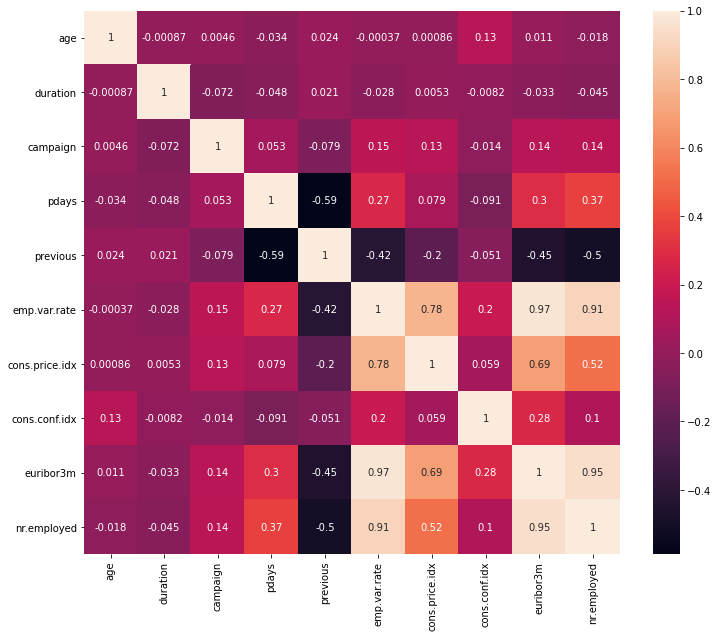

In [12]:
plt.figure(figsize = (12,10))
sns.heatmap(corr, annot = True, cbar = True)
plt.show()

### Above is a mini comparison to see if corr() and pp.ProfileReports correlation heatmaps are similar, they are

In [22]:
df.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

<AxesSubplot:>

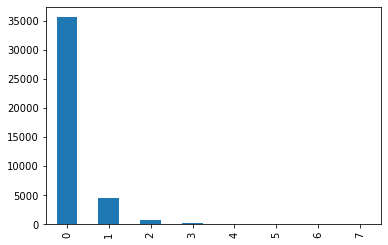

In [20]:
df['previous'].value_counts().plot(kind = 'bar')

<AxesSubplot:>

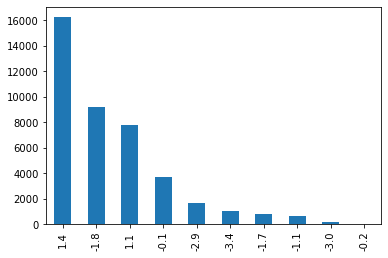

In [21]:
df['emp.var.rate'].value_counts().plot(kind = 'bar')

<AxesSubplot:>

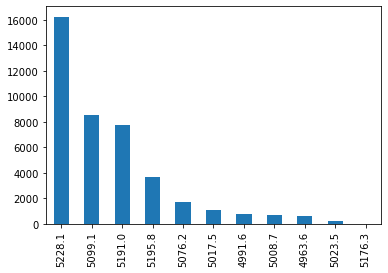

In [24]:
df['nr.employed'].value_counts().plot(kind = 'bar')

<AxesSubplot:ylabel='previous'>

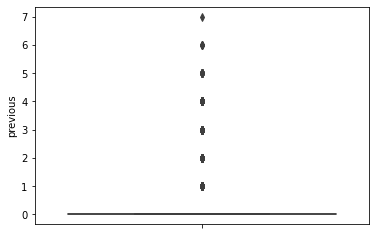

In [27]:
sns.boxplot(data = df, y = 'previous') # Many many 0's as seen a few lines of code up

<AxesSubplot:ylabel='emp.var.rate'>

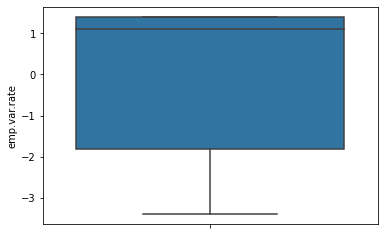

In [28]:
sns.boxplot(data = df, y = 'emp.var.rate')

<AxesSubplot:ylabel='nr.employed'>

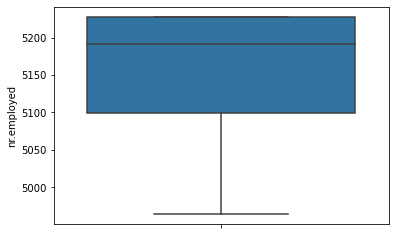

In [29]:
sns.boxplot(data = df, y = 'nr.employed')

<AxesSubplot:ylabel='euribor3m'>

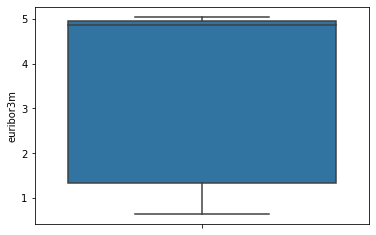

In [30]:
sns.boxplot(data = df, y = 'euribor3m')

## Dropping Highly correlated attributes

In [31]:
df.drop(labels = ['previous', 'emp.var.rate', 'nr.employed', 'euribor3m'], axis = 1, inplace = True)

In [33]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,poutcome,cons.price.idx,cons.conf.idx,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,nonexistent,93.994,-36.4,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,nonexistent,93.994,-36.4,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,nonexistent,93.994,-36.4,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,nonexistent,93.994,-36.4,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,nonexistent,93.994,-36.4,no


In [41]:
pd.get_dummies(df, df.columns[df.dtypes == 'object'])

,age,duration,campaign,pdays,cons.price.idx,cons.conf.idx,job_admin.,job_blue-collar,job_entrepreneur,job_housemaid,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,y_no,y_yes
0,56,261,1,999,93.994,-36.4,0,0,0,1,...,0,1,0,0,0,0,1,0,1,0
1,57,149,1,999,93.994,-36.4,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
2,37,226,1,999,93.994,-36.4,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
3,40,151,1,999,93.994,-36.4,1,0,0,0,...,0,1,0,0,0,0,1,0,1,0
4,56,307,1,999,93.994,-36.4,0,0,0,0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,94.767,-50.8,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1
41184,46,383,1,999,94.767,-50.8,0,1,0,0,...,1,0,0,0,0,0,1,0,1,0
41185,56,189,2,999,94.767,-50.8,0,0,0,0,...,1,0,0,0,0,0,1,0,1,0
41186,44,442,1,999,94.767,-50.8,0,0,0,0,...,1,0,0,0,0,0,1,0,0,1


In [42]:
for i in df.columns[df.dtypes == 'object']:
    print(i, "::", df[i].unique())

job :: ['housemaid' 'services' 'admin.' 'blue-collar' 'technician' 'retired'
 'management' 'unemployed' 'self-employed' 'unknown' 'entrepreneur'
 'student']
marital :: ['married' 'single' 'divorced' 'unknown']
education :: ['basic.4y' 'high.school' 'basic.6y' 'basic.9y' 'professional.course'
 'unknown' 'university.degree' 'illiterate']
default :: ['no' 'unknown' 'yes']
housing :: ['no' 'yes' 'unknown']
loan :: ['no' 'yes' 'unknown']
contact :: ['telephone' 'cellular']
month :: ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'mar' 'apr' 'sep']
day_of_week :: ['mon' 'tue' 'wed' 'thu' 'fri']
poutcome :: ['nonexistent' 'failure' 'success']
y :: ['no' 'yes']


In [43]:
df2 = df

In [44]:
for i in df.columns[df.dtypes == 'object']:
    print(i, "::")
    df2[i] = df[i].astype('category')
    df2[i] = df2[i].cat.codes

job ::
marital ::
education ::
default ::
housing ::
loan ::
contact ::
month ::
day_of_week ::
poutcome ::
y ::


In [45]:
df2.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,poutcome,cons.price.idx,cons.conf.idx,y
0,56,3,1,0,0,0,0,1,6,1,261,1,999,1,93.994,-36.4,0
1,57,7,1,3,1,0,0,1,6,1,149,1,999,1,93.994,-36.4,0
2,37,7,1,3,0,2,0,1,6,1,226,1,999,1,93.994,-36.4,0
3,40,0,1,1,0,0,0,1,6,1,151,1,999,1,93.994,-36.4,0
4,56,7,1,3,0,0,2,1,6,1,307,1,999,1,93.994,-36.4,0


In [46]:
df2.dtypes

age                 int64
job                  int8
marital              int8
education            int8
default              int8
housing              int8
loan                 int8
contact              int8
month                int8
day_of_week          int8
duration            int64
campaign            int64
pdays               int64
poutcome             int8
cons.price.idx    float64
cons.conf.idx     float64
y                    int8
dtype: object

## Fixing Any outliers

In [34]:
q1 = df.quantile(0.25)
q3 = df.quantile(0.75)

In [35]:
IQR = q3 = q1

In [36]:
IQR

age                32.000
duration          102.000
campaign            1.000
pdays             999.000
cons.price.idx     93.075
cons.conf.idx     -42.700
Name: 0.25, dtype: float64

In [47]:
OUTLIER = (df2 < (q1 -1.5 * IQR)) | (df2 > (q3 + 1.5 * IQR))

In [48]:
OUTLIER

,age,campaign,cons.conf.idx,cons.price.idx,contact,day_of_week,default,duration,education,housing,job,loan,marital,month,pdays,poutcome,y
0,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
1,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
41184,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False
41185,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
41186,False,False,True,False,False,False,False,True,False,False,False,False,False,False,False,False,False


In [50]:
df2_no_outlier = df2[~((df2 < (q1 - 1.5 * IQR)) | (df2 > (q3 + 1.5 * IQR))).any(axis=1)]

In [51]:
df2_no_outlier

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,poutcome,cons.price.idx,cons.conf.idx,y


### Seems there's an outlier in all of the data, guess we will have to ignore this and move on

In [52]:
df2.rename(columns={'y': 'class'}, inplace = True)

In [53]:
df2.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,poutcome,cons.price.idx,cons.conf.idx,class
0,56,3,1,0,0,0,0,1,6,1,261,1,999,1,93.994,-36.4,0
1,57,7,1,3,1,0,0,1,6,1,149,1,999,1,93.994,-36.4,0
2,37,7,1,3,0,2,0,1,6,1,226,1,999,1,93.994,-36.4,0
3,40,0,1,1,0,0,0,1,6,1,151,1,999,1,93.994,-36.4,0
4,56,7,1,3,0,0,2,1,6,1,307,1,999,1,93.994,-36.4,0


In [55]:
df2.columns

Index(['age', 'job', 'marital', 'education', 'default', 'housing', 'loan',
       'contact', 'month', 'day_of_week', 'duration', 'campaign', 'pdays',
       'poutcome', 'cons.price.idx', 'cons.conf.idx', 'class'],
      dtype='object')

<AxesSubplot:>

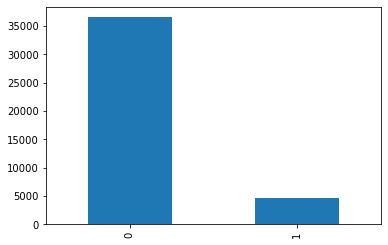

In [56]:
df['class'].value_counts().plot(kind = 'bar') # 0 = no 1 = yes

In [57]:
import pycaret.classification as pc

In [58]:
dir(pc)

['Any',
 'Dict',
 'Display',
 'List',
 'MLUsecase',
 'Optional',
 'Tuple',
 'Union',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__spec__',
 'add_metric',
 'automl',
 'blend_models',
 'calibrate_model',
 'compare_models',
 'create_model',
 'deploy_model',
 'enable_colab',
 'ensemble_model',
 'evaluate_model',
 'finalize_model',
 'get_config',
 'get_logs',
 'get_metrics',
 'interpret_model',
 'io',
 'is_in_colab',
 'load_config',
 'load_model',
 'models',
 'np',
 'optimize_threshold',
 'pd',
 'plot_model',
 'predict_model',
 'pull',
 'pycaret',
 'remove_metric',
 'save_config',
 'save_model',
 'set_config',
 'setup',
 'stack_models',
 'traceback',
 'tune_model',
 'warnings']

In [59]:
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


# Train 70/30

In [61]:
pc.setup(data = df2, target = 'class', train_size = 0.7)

,Description,Value
0,session_id,2821
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(41188, 17)"
5,Missing Values,False
6,Numeric Features,16
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


('lightgbm',
 StratifiedKFold(n_splits=10, random_state=2821, shuffle=False),
 2821,
 {'acc': <pycaret.containers.metrics.classification.AccuracyMetricContainer at 0x258dfa64190>,
  'auc': <pycaret.containers.metrics.classification.ROCAUCMetricContainer at 0x258dfa641c0>,
  'recall': <pycaret.containers.metrics.classification.RecallMetricContainer at 0x258dfa64250>,
  'precision': <pycaret.containers.metrics.classification.PrecisionMetricContainer at 0x258dfa64340>,
  'f1': <pycaret.containers.metrics.classification.F1MetricContainer at 0x258dfa64490>,
  'kappa': <pycaret.containers.metrics.classification.KappaMetricContainer at 0x258dfa645e0>,
  'mcc': <pycaret.containers.metrics.classification.MCCMetricContainer at 0x258dfa64670>},
 False,
 5,
 Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=

In [62]:
pc.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9145,0.9451,0.5199,0.6490,0.5770,0.5301,0.5343,0.2510
catboost,CatBoost Classifier,0.9134,0.9435,0.5082,0.6459,0.5683,0.5210,0.5259,17.4810
gbc,Gradient Boosting Classifier,0.9131,0.9430,0.4708,0.6583,0.5487,0.5022,0.5109,0.7830
rf,Random Forest Classifier,0.9116,0.9375,0.4878,0.6392,0.5528,0.5048,0.5107,0.9100
xgboost,Extreme Gradient Boosting,0.9110,0.9408,0.5125,0.6274,0.5637,0.5147,0.5183,0.9930
ada,Ada Boost Classifier,0.9082,0.9344,0.3836,0.6548,0.4836,0.4370,0.4559,0.3560
et,Extra Trees Classifier,0.9070,0.9298,0.4093,0.6328,0.4963,0.4478,0.4610,0.8250
lr,Logistic Regression,0.9057,0.8889,0.3345,0.6575,0.4428,0.3972,0.4247,1.6420
lda,Linear Discriminant Analysis,0.9028,0.8947,0.3960,0.6014,0.4771,0.4261,0.4376,0.0310
ridge,Ridge Classifier,0.9026,0.0000,0.2890,0.6483,0.3993,0.3548,0.3895,0.0140


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=2821, reg_alpha=0.0, reg_lambda=0.0, silent=True,
               subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

### Once again light gradient boost, but with an accuracy of 91.4% this time with the 70/30 score
+ However, it loses score on Recall and Prec.

In [63]:
lgbm = pc.create_model('lightgbm')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9088,0.9425,0.4938,0.6178,0.5489,0.4989,0.5027
1,0.9185,0.9452,0.5418,0.6679,0.5983,0.5535,0.5572
2,0.9074,0.9398,0.5077,0.6029,0.5513,0.5000,0.5023
3,0.9095,0.9467,0.4768,0.6260,0.5413,0.4921,0.4977
4,0.9157,0.9474,0.5170,0.6575,0.5789,0.5328,0.5375
5,0.9178,0.9453,0.5263,0.6693,0.5893,0.5443,0.5492
6,0.9192,0.9441,0.5741,0.6619,0.6149,0.5700,0.5718
7,0.9126,0.9446,0.5216,0.6353,0.5729,0.5247,0.5279
8,0.9161,0.9467,0.5401,0.6530,0.5912,0.5449,0.5480
9,0.9195,0.9486,0.5000,0.6983,0.5827,0.5395,0.5488


In [64]:
Tuned_lgbm = pc.tune_model(lgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9102,0.9433,0.4846,0.6305,0.5480,0.4991,0.5044
1,0.9213,0.9461,0.5666,0.6778,0.6172,0.5737,0.5766
2,0.9081,0.9386,0.5015,0.6090,0.5501,0.4994,0.5024
3,0.9098,0.9453,0.4830,0.6265,0.5455,0.4963,0.5015
4,0.9140,0.9484,0.4923,0.6543,0.5618,0.5152,0.5216
5,0.9227,0.9470,0.5789,0.6825,0.6265,0.5836,0.5861
6,0.9147,0.9445,0.5340,0.6455,0.5845,0.5374,0.5404
7,0.9105,0.9434,0.5278,0.6196,0.5700,0.5204,0.5225
8,0.9199,0.9500,0.5247,0.6883,0.5954,0.5519,0.5581
9,0.9206,0.9465,0.4846,0.7169,0.5783,0.5362,0.5488


In [65]:
Tuned_lgbm = pc.tune_model(lgbm, optimize = 'Accuracy')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9102,0.9433,0.4846,0.6305,0.5480,0.4991,0.5044
1,0.9213,0.9461,0.5666,0.6778,0.6172,0.5737,0.5766
2,0.9081,0.9386,0.5015,0.6090,0.5501,0.4994,0.5024
3,0.9098,0.9453,0.4830,0.6265,0.5455,0.4963,0.5015
4,0.9140,0.9484,0.4923,0.6543,0.5618,0.5152,0.5216
5,0.9227,0.9470,0.5789,0.6825,0.6265,0.5836,0.5861
6,0.9147,0.9445,0.5340,0.6455,0.5845,0.5374,0.5404
7,0.9105,0.9434,0.5278,0.6196,0.5700,0.5204,0.5225
8,0.9199,0.9500,0.5247,0.6883,0.5954,0.5519,0.5581
9,0.9206,0.9465,0.4846,0.7169,0.5783,0.5362,0.5488


### Tuning slightly increases the Accuracy this time

In [66]:
pc.evaluate_model(Tuned_lgbm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

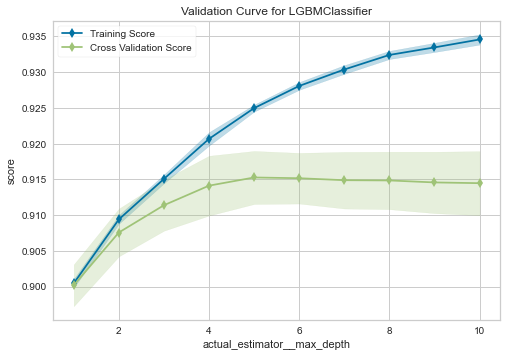

In [74]:
pc.plot_model(Tuned_lgbm, plot = 'vc')

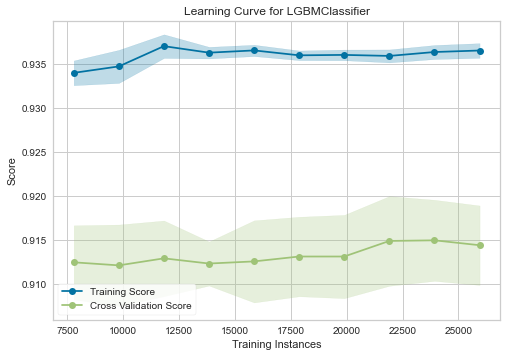

In [75]:
pc.plot_model(Tuned_lgbm, plot = 'learning')

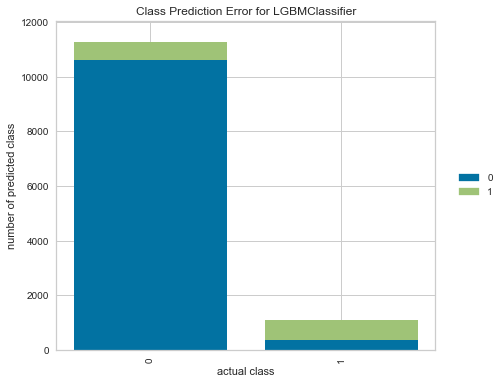

In [76]:
pc.plot_model(Tuned_lgbm, plot = 'error')

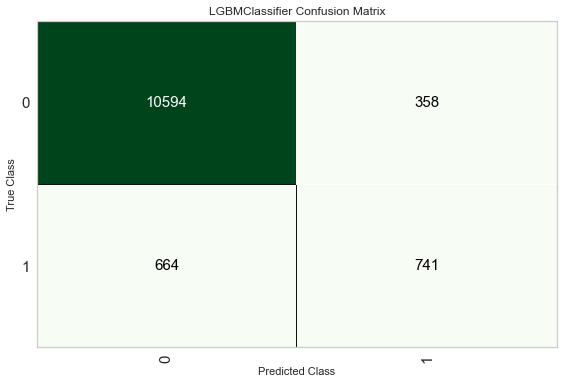

In [77]:
pc.plot_model(Tuned_lgbm, plot = 'confusion_matrix') # Better confusion matrix this time

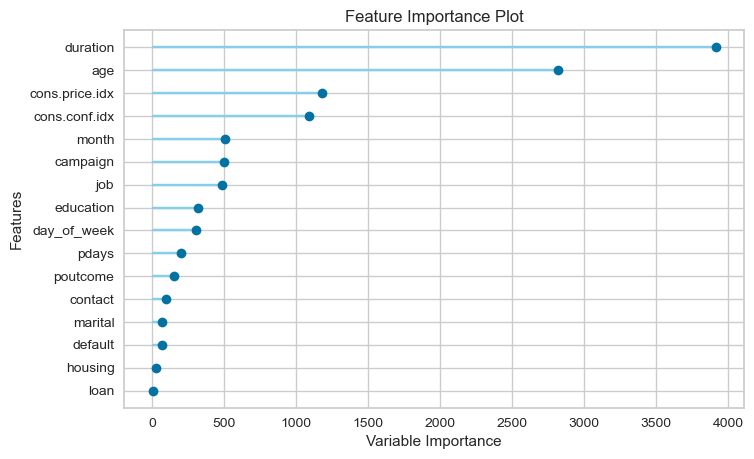

In [78]:
pc.plot_model(Tuned_lgbm, plot = 'feature_all') # Duration and age still dominates, but cons.price.idx and cons.conf.idx are more important

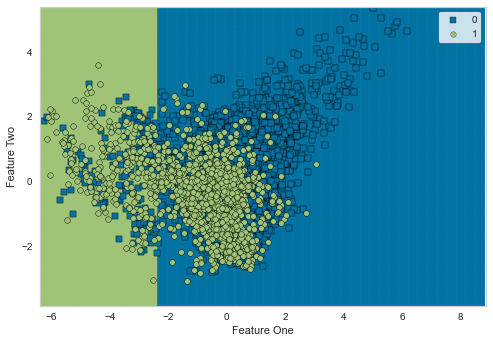

In [79]:
pc.plot_model(Tuned_lgbm, plot = 'boundary')

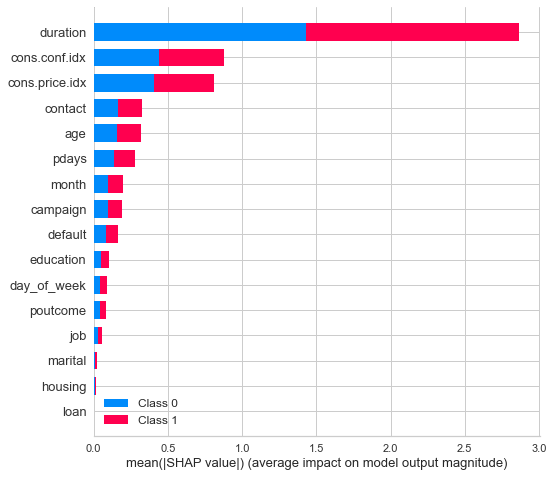

In [80]:
pc.interpret_model(Tuned_lgbm)

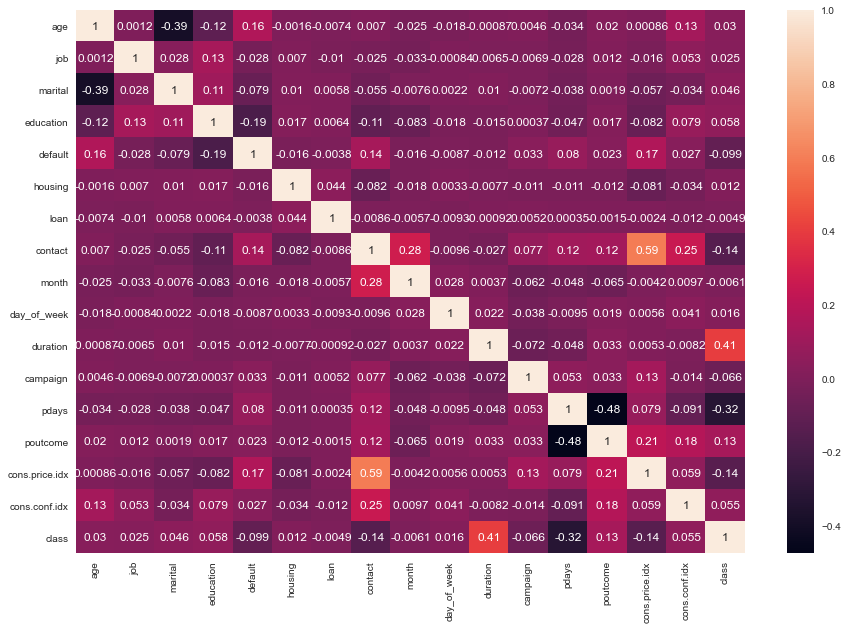

In [82]:
corr2 = df2.corr()
plt.figure(figsize = (15,10))
sns.heatmap(corr2, annot = True, cbar = True)
plt.show()

In [83]:
pp.ProfileReport(df2)

### New narrative
+ With cons.price.idx having more importance now it seems contact has a higher correlation with it
+ However, cons.conf.idx are also more important, yet there is somewhat of a lack of correlation with anything
+ Duration only has a correlation with class, the target variable

In [84]:
Final_mod = pc.finalize_model(Tuned_lgbm)

In [85]:
Pred = pc.predict_model(Final_mod)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Light Gradient Boosting Machine,0.9366,0.9685,0.6399,0.7645,0.6966,0.6616,0.6648


### Mini Conclusion
+ Despite removing highly correlated attributes, it turns out that actually hinders the model's accuracy slightly
+ With a final score of being 93.6% with the 70/30 train/test rule
+ Would it have been a mistake to get rid of attributes for machine learning?
+ Or perhaps only a good idea when exploring data to create new findings
+ As it was already known in the dirty version (check my github) that emp.var.rate and euribor3m are important attributes

# 80/20 Rule

In [86]:
pc.setup(data = df2, target = 'class', train_size = 0.8)

,Description,Value
0,session_id,8543
1,Target,class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(41188, 17)"
5,Missing Values,False
6,Numeric Features,16
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


('lightgbm',
 StratifiedKFold(n_splits=10, random_state=8543, shuffle=False),
 8543,
 {'acc': <pycaret.containers.metrics.classification.AccuracyMetricContainer at 0x258f5214580>,
  'auc': <pycaret.containers.metrics.classification.ROCAUCMetricContainer at 0x258f5214a30>,
  'recall': <pycaret.containers.metrics.classification.RecallMetricContainer at 0x258f5214e50>,
  'precision': <pycaret.containers.metrics.classification.PrecisionMetricContainer at 0x258f5214e80>,
  'f1': <pycaret.containers.metrics.classification.F1MetricContainer at 0x258f5214250>,
  'kappa': <pycaret.containers.metrics.classification.KappaMetricContainer at 0x258f51d91c0>,
  'mcc': <pycaret.containers.metrics.classification.MCCMetricContainer at 0x258f51d9dc0>},
 False,
 5,
 Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=

In [87]:
pc.compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.9150,0.9431,0.4812,0.6677,0.5590,0.5133,0.5219,1.2840
catboost,CatBoost Classifier,0.9149,0.9448,0.5147,0.6540,0.5754,0.5289,0.5339,18.6530
lightgbm,Light Gradient Boosting Machine,0.9147,0.9458,0.5242,0.6488,0.5792,0.5324,0.5365,0.2440
rf,Random Forest Classifier,0.9130,0.9389,0.4974,0.6464,0.5616,0.5142,0.5200,1.0480
xgboost,Extreme Gradient Boosting,0.9128,0.9412,0.5253,0.6354,0.5743,0.5263,0.5297,1.3930
et,Extra Trees Classifier,0.9090,0.9310,0.4203,0.6442,0.5082,0.4605,0.4736,1.0470
ada,Ada Boost Classifier,0.9077,0.9350,0.3789,0.6522,0.4788,0.4321,0.4516,0.3760
lr,Logistic Regression,0.9067,0.8888,0.3432,0.6640,0.4519,0.4066,0.4334,1.9000
lda,Linear Discriminant Analysis,0.9040,0.8939,0.3968,0.6116,0.4807,0.4306,0.4431,0.0370
ridge,Ridge Classifier,0.9028,0.0000,0.2907,0.6495,0.4009,0.3564,0.3910,0.0140


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=8543, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [89]:
GBC = pc.create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9102,0.9409,0.4634,0.6357,0.5361,0.4877,0.4951
1,0.9159,0.9448,0.5095,0.6620,0.5758,0.5300,0.5356
2,0.9178,0.9409,0.5122,0.6750,0.5824,0.5378,0.5441
3,0.9132,0.9428,0.4607,0.6615,0.5431,0.4969,0.5068
4,0.9065,0.9385,0.4173,0.6235,0.5000,0.4507,0.4617
5,0.9184,0.9450,0.4892,0.6935,0.5737,0.5300,0.5399
6,0.9162,0.9499,0.5162,0.6632,0.5805,0.5348,0.5400
7,0.9187,0.9440,0.4730,0.7056,0.5663,0.5234,0.5362
8,0.9159,0.9385,0.4865,0.6742,0.5651,0.5200,0.5284
9,0.9168,0.9461,0.4838,0.6832,0.5665,0.5219,0.5315


In [91]:
Tuned_GBC = pc.tune_model(GBC)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9083,0.9376,0.4905,0.6136,0.5452,0.4949,0.4988
1,0.9099,0.9433,0.4661,0.6324,0.5367,0.4880,0.4950
2,0.9086,0.9371,0.5285,0.6056,0.5644,0.5136,0.5151
3,0.9156,0.9412,0.5203,0.6553,0.5801,0.5339,0.5382
4,0.9053,0.9364,0.4743,0.5973,0.5287,0.4768,0.4808
5,0.9153,0.9436,0.4838,0.6704,0.5620,0.5165,0.5249
6,0.9138,0.9465,0.5351,0.6387,0.5824,0.5347,0.5373
7,0.9165,0.9427,0.4676,0.6892,0.5572,0.5130,0.5247
8,0.9077,0.9353,0.5000,0.6086,0.5490,0.4981,0.5011
9,0.9126,0.9425,0.5189,0.6358,0.5714,0.5233,0.5267


### Tuning Gradient Boost Classifier decreases accuracy

In [92]:
pc.evaluate_model(GBC)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

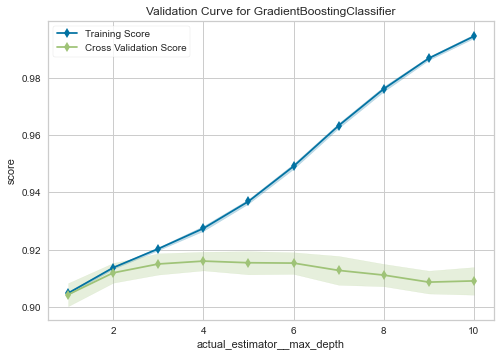

In [93]:
pc.plot_model(GBC, plot = 'vc')

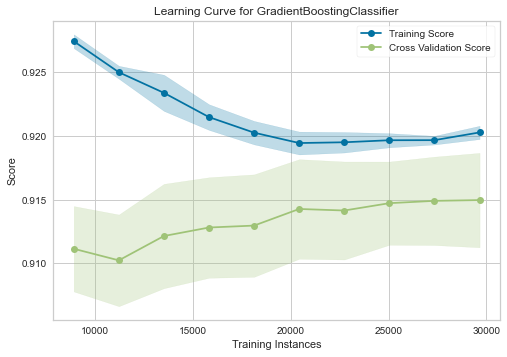

In [94]:
pc.plot_model(GBC, plot = 'learning')

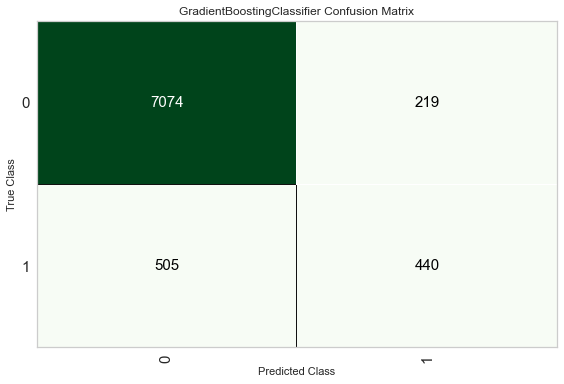

In [95]:
pc.plot_model(GBC, plot = 'confusion_matrix')

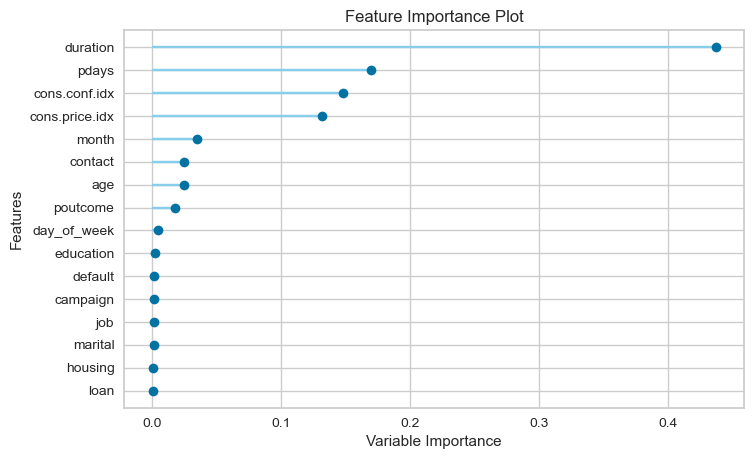

In [96]:
pc.plot_model(GBC, plot = 'feature_all') #Pdays is more important according to GBC 80/20 rule, interesting

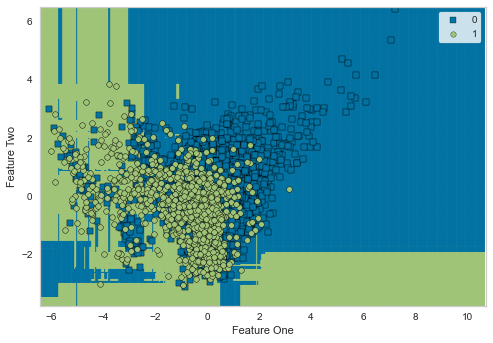

In [97]:
pc.plot_model(GBC, plot = 'boundary')

In [98]:
Final_Mod = pc.finalize_model(GBC)

In [99]:
Pred2 = pc.predict_model(Final_Mod)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9160,0.9512,0.4942,0.6858,0.5744,0.5292,0.5379


# Conclusion
+ Gradient Boosting Classifier final score is 91.6%
+ Interestingly it did increase the feature importance of pdays
+ However, a lower score compared to the chosen Light gradient boost model as that one scored 93.6%
+ However, that model did not care about pdays as much
+ From getting rid of the highly correlated algorithms we learn that pdays,  cons.price.idx and cons.conf. are attributes not to miss out on